<a href="https://colab.research.google.com/github/oamerl/machine-learning-projects/blob/main/Reinforcement-Learning/catch-environment/catch_environment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title Imports
%%capture
!pip install dm_env

import abc
import collections
import dm_env
import numpy as np
import tensorflow as tf

from matplotlib import pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
rc('animation', html='jshtml')
%matplotlib inline

from collections import deque
from keras.layers import Dense
from keras.optimizers import Adam
from keras.models import Sequential

from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

import random
import pickle as pk

## The Catch environment (was provided, not written by me)

*Catch* is a classic, simple RL environment, where the agent needs to learn to catch a falling ball by moving a paddle around. Below we provide a simple implementation of the environment, in which the three scalar actions $(0, 1, 2)$ correspond to moving the paddle to the (left, middle, right) respectively. The agent gets a reward of $1.0$ if the paddle was right below the ball when it reached the bottom of the board, otherwise the agent receives $0.0$ reward.

<img src="https://drive.google.com/uc?id=1xkpEZAkl08E_XJQsCe8b3Y0JYRhsScS2" width="400">


In [ ]:
#@title Catch environment implementation
_ACTIONS = (0, 1, 2)  # Left, no-op, right.


class Catch(dm_env.Environment):
  """A Catch environment built on the `dm_env.Environment` class."""

  def __init__(self, rows=10, columns=5, seed=1):
    self._rows = rows
    self._columns = columns
    self._rng = np.random.RandomState(seed)
    self._board = np.zeros((rows, columns), dtype=np.float32)
    self._ball_x = None
    self._ball_y = None
    self._paddle_x = None
    self._paddle_y = self._rows - 1
    self._reset_next_step = True

  def reset(self):
    """Returns the first `TimeStep` of a new episode."""
    self._reset_next_step = False
    self._ball_x = self._rng.randint(self._columns)
    self._ball_y = 0
    self._paddle_x = self._columns // 2
    return dm_env.restart(self._observation())

  def step(self, action):
    """Updates the environment according to the action."""
    if self._reset_next_step:
      return self.reset()

    # Move the paddle.
    dx = _ACTIONS[action] - 1
    self._paddle_x = np.clip(self._paddle_x + dx, 0, self._columns - 1)

    # Drop the ball.
    self._ball_y += 1

    # Check for termination.
    if self._ball_y == self._paddle_y:
      reward = 1. if self._paddle_x == self._ball_x else -1.
      self._reset_next_step = True
      return dm_env.termination(reward=reward, observation=self._observation())
    else:
      return dm_env.transition(reward=0., observation=self._observation())

  def _observation(self):
    self._board.fill(0.)
    self._board[self._ball_y, self._ball_x] = 1.
    self._board[self._paddle_y, self._paddle_x] = 1.
    return self._board.copy()

  def observation_spec(self):
    return dm_env.specs.BoundedArray(
        shape=self._board.shape,
        dtype=self._board.dtype,
        name="board",
        minimum=0,
        maximum=1)

  def action_spec(self):
    return dm_env.specs.DiscreteArray(
        dtype=int, num_values=len(_ACTIONS), name="action")

### Let's observe a random agent acting on Catch!

First we are going to take a look at what the agent-environment interaction looks like when an agent acts randomly. We see that the board is represented by a $10\times 5$ array of zeroes, where both the ball and the paddle position are denoted by a value of $1.0$.

In [ ]:
#@title Take random actions
env = Catch()

res = [] # result
timestep = env.reset()
print('Observation format (what the agents sees):')
print(timestep.observation)
res.append(timestep.observation)
for step in range(50):
  action = np.random.randint(3)
  timestep = env.step(action)
  res.append(timestep.observation)

Observation format (what the agents sees):

[[0. 0. 0. 1. 0.]

 [0. 0. 0. 0. 0.]

 [0. 0. 0. 0. 0.]

 [0. 0. 0. 0. 0.]

 [0. 0. 0. 0. 0.]

 [0. 0. 0. 0. 0.]

 [0. 0. 0. 0. 0.]

 [0. 0. 0. 0. 0.]

 [0. 0. 0. 0. 0.]

 [0. 0. 1. 0. 0.]]


In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim = animation.FuncAnimation(plt.gcf(), animate, frames=res, blit=False, repeat=True)

In [ ]:
anim

## The Agent

In [ ]:
#@title Agent interface

class Agent(abc.ABC):
  """Base class defining the agent interface."""

  @abc.abstractmethod
  def select_action(self, latest_obs):
    """Choose an action to take in the environment."""
    ...

  @abc.abstractmethod
  def observe(self, action, next_timestep: dm_env.TimeStep):
    """Take note of what happened in the environment after taking an action."""
    ...

  @abc.abstractmethod
  def observe_first(self, first_timestep: dm_env.TimeStep):
    """Take note of the environment state before taking any actions."""
    ...

  @abc.abstractmethod
  def update(self):
    """Update the agent's internal understanding of the environment dynamics."""
    ...


In [ ]:
# @title Training and evaluation

def train(
    agent: Agent,
    env: dm_env.Environment,
    num_episodes = 100):
  """Environment loop during which an agent learns from the interactions."""

  print('Training agent...')
  training_returns = []
  sum_returns = 0.0

  for episode in range(num_episodes):
    timestep = env.reset()
    agent.observe_first(timestep)
    sum_rewards = 0.0

    while timestep.step_type != dm_env.StepType.LAST:
      action = agent.select_action(timestep.observation)
      timestep = env.step(action)

      if timestep.reward is not None:
        sum_rewards += timestep.reward

      agent.observe(action, timestep)
      agent.update()

    training_returns.append(sum_rewards)

    if episode % 10 == 0:
      print(f'Episode: {episode}, Return: {sum_rewards}, '
            f'Mean return: {np.mean(training_returns[-50:])}')
  return training_returns

In [ ]:
def evaluate(
    agent: Agent,
    env: dm_env.Environment,
    num_episodes = 10):
  """Environment loop during which the agent doesn't learn."""

  print('\nEvaluating agent...')
  agent.set_epsilon(0)
  eval_returns = []
  observations = []
  for episode in range(num_episodes):
    sum_rewards = 0.0
    timestep = env.reset()
    observations.append(timestep.observation)
    agent.observe_first(timestep)
    while timestep.step_type != dm_env.StepType.LAST:
      action = agent.select_action(timestep.observation)
      timestep = env.step(action)
      observations.append(timestep.observation)
      if timestep.reward is not None:
        sum_rewards += timestep.reward
      agent.observe(action, timestep)
      # agent.update()  # Don't update.
    eval_returns.append(sum_rewards)
    print(f'Episode: {episode}, Return: {sum_rewards}')
  print(f'mean: {np.mean(eval_returns)}, std: {np.std(eval_returns)}')
  return observations

## 1. Tabular Q-Learning Agent

In Q-learning, the agent estimates the *value* of (state, action) pairs. This estimate reflects how much total return the agent anticipates up until the end of the episode, assuming that it takes action $A$ in state $S$. In *tabular* Q-learning in particular, these value estimates are stored explicitly in a table, for example:

| (State, Action) | Q-value  |
| ----------------| ---------|
| ($S_i$, left)   | 0.7      |
| ($S_i$, stay)   | 0.0      |
| ($S_i$, right)  | -0.5     |
| ($S_j$, left)   | 0.32     |
| ($S_j$, stay)   | -1.0     |
| ($S_j$, right)  | 0.1      |
| $\dots$         | $\dots$  |

These estimates of (state, action) pairs will drive the behaviour (*policy*) of the agent.

Alternatively we could also represent the value estimates in matrix format:

|  Q-values       | left     | stay     | right    |
| ----------------| ---------| ---------| ---------|
| $S_i$           | 0.7      | 0.0      | -0.5     |
| $S_j$           | 0.32     | -1.0     | 0.1      |
| $\dots$         | $\dots$  | $\dots$  | $\dots$  |

### Train Tabular Q-learning agent

During training, the agent acts in the environment (i.e. plays the game) and makes periodic updates of its Q-value estimates based on what it observes. In particular, the estimates are updated based on the [Bellman equation](https://en.wikipedia.org/wiki/Bellman_equation):

$$Q_{new}(s_t, a_t) = Q_{old}(s_t, a_t) + \alpha *(R_t + \gamma \max_a Q(s_{t+1}, a)  - Q_{old}(s_t, a_t))$$
During this process, the Q-value estimates will become more and more accurate, leading to gradually increasing performance (i.e. the agent is *learning* to play the game well).

After the training process, the agent is *evaluated*. This means we assess its performance on the environment without any randomness in its behaviour. At this time, the agent does not make any updates to its Q-value estimates, therefore its behaviour is not changing anymore.

In [ ]:
class QLearning(Agent):
  """Simple Q-learning agent."""

  def __init__(self,
               learning_rate: float = 0.2,
               discount: float = 0.99,
               epsilon: float = 0.1):
    """Initialize the agent.

    Args:
      learning_rate: (alpha) Controls how quickly we're willing to change
        the q-value estimates.
      discount: (gamma) Controls how much we care about immediate rewards vs
        long term rewards.
      epsilon: With small probability, the agent will take random actions
        instead of always picking the best action. This is to encourage
        diversity of experiences (exploration).
    """
    self._learning_rate = learning_rate
    self._epsilon = epsilon
    self._discount = discount

    # In the beginning, the agent doesn't know anything about the Q-values,
    # so the table will be initialized randomly.
    self._q = collections.defaultdict(np.random.random)
    self._latest_action = None
    self._timestep_before_action = None
    self._timestep_after_action = None

  def select_action(self, latest_obs):
    """Chooses an action to take based on the current Q-value estimates."""
    action = np.argmax([self._q_func(latest_obs, a) for a in range(3)])
    if np.random.random() < self._epsilon:
      action = np.random.randint(0, 3)
    return action

  def observe_first(self, first_timestep: dm_env.TimeStep):
    self._timestep_after_action = first_timestep

  def observe(self, action, next_timestep):
    self._latest_action = action
    self._timestep_before_action = self._timestep_after_action
    self._timestep_after_action = next_timestep

  def update(self):
    """Updates the Q-value estimates based on the latest interaction."""
    reward = self._timestep_after_action.reward
    obs = self._timestep_after_action.observation
    obs_before = self._timestep_before_action.observation

    # Remember the Bellman equation:
    # q_new(s,a) = q_old(s, a) + alpha * (reward + gamma * argmax(q_old(s, a)) - q_old(s,a))
    best_action = self._best_action(obs)
    td = reward + self._discount * self._q_func(obs, best_action) - self._q_func(
        obs_before, self._latest_action)
    self._q[(str(obs_before), self._latest_action)] += self._learning_rate * td

  def _best_action(self, obs):
    return np.argmax([self._q_func(obs, a) for a in range(3)])

  def _q_func(self, obs, action):
    return self._q[(str(obs), action)]

  def set_epsilon(self, eps: float):
    self._epsilon = eps

If all goes well, the **return** should be gradually increasing over the course of training!

In [ ]:
env = Catch()
agent = QLearning(epsilon=0.1)

rewards_per_episode = train(agent, env, num_episodes=1000)
res_ql = evaluate(agent, env)

Training agent...

Episode: 0, Return: -1.0, Mean return: -1.0

Episode: 10, Return: -1.0, Mean return: -1.0

Episode: 20, Return: -1.0, Mean return: -0.6190476190476191

Episode: 30, Return: -1.0, Mean return: -0.6774193548387096

Episode: 40, Return: -1.0, Mean return: -0.6097560975609756

Episode: 50, Return: 1.0, Mean return: -0.56

Episode: 60, Return: 1.0, Mean return: -0.32

Episode: 70, Return: 1.0, Mean return: -0.32

Episode: 80, Return: -1.0, Mean return: -0.2

Episode: 90, Return: -1.0, Mean return: -0.12

Episode: 100, Return: 1.0, Mean return: -0.04

Episode: 110, Return: -1.0, Mean return: -0.16

Episode: 120, Return: 1.0, Mean return: 0.0

Episode: 130, Return: 1.0, Mean return: 0.12

Episode: 140, Return: 1.0, Mean return: 0.16

Episode: 150, Return: 1.0, Mean return: 0.2

Episode: 160, Return: 1.0, Mean return: 0.32

Episode: 170, Return: -1.0, Mean return: 0.28

Episode: 180, Return: -1.0, Mean return: 0.16

Episode: 190, Return: -1.0, Mean return: 0.2

Episode: 200,

In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res_ql.pkl', 'wb') as f:  # open a file
    pk.dump(res_ql, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res_ql.pkl', 'rb') as f:
    res_ql = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res_ql[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim = animation.FuncAnimation(plt.gcf(), animate, frames=res_ql, blit=False, repeat=True)

In [ ]:
anim

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_qlearning.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_qlearning.pkl', 'rb') as f:
    rewards_per_episode = pk.load(f) # deserialize using load()
    #print(len(rewards_per_episode)) # print list length for checking purposes
f.close()

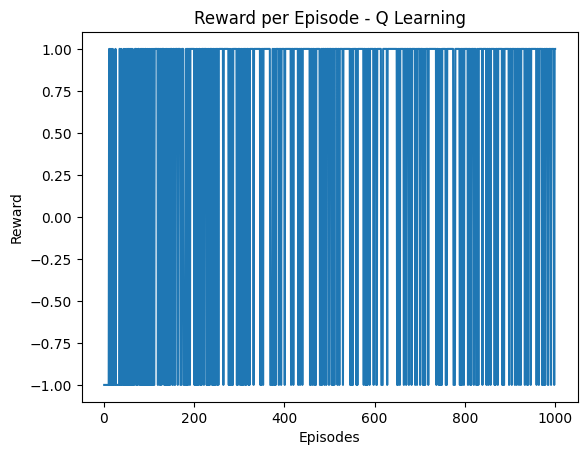

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode) + 1),rewards_per_episode)
plt.title('Reward per Episode - Q Learning')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

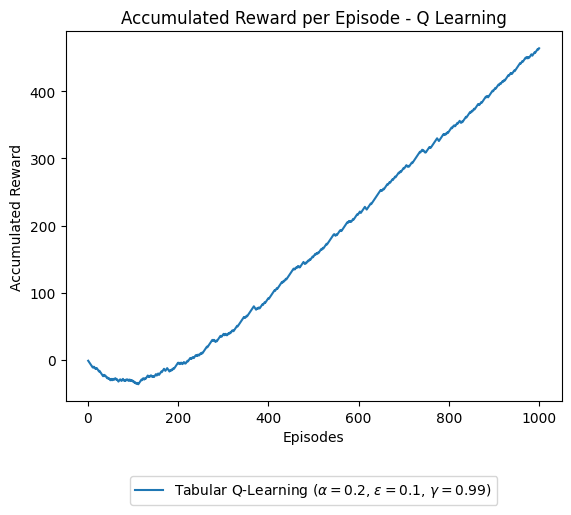

In [ ]:
rewards_per_episode_accum = np.cumsum(rewards_per_episode)
plt.plot(np.arange(1, len(rewards_per_episode_accum) + 1), rewards_per_episode_accum, label= r'Tabular Q-Learning ($\alpha = 0.2$, $\epsilon = 0.1$, $\gamma = 0.99$)')
plt.title('Accumulated Reward per Episode - Q Learning')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
plt.legend(loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

## 2. Q-Learning agent with Neural Networks

A major limitation of the tabular approach is that if the state space is large, it will quickly become infeasible to obtain a realistic estimate of each of their Q-values. Apart from explicit Q-value tables, another way for an agent to represent its Q-value estimates is using *Neural Networks*. Neural networks are [universal function approximators](https://en.wikipedia.org/wiki/Universal_approximation_theorem), therefore in theory they can be arbitrarily accurate estimators of the true $Q(s,a)$ function. They also help overcome the problem of large state spaces, because they can exploit underlying structure in the observation space.

In our Catch example, we can take our existing tabular Q-learning agent and replace its `_q_func()` and `update()` methods to use neural networks. The `_q_func()` method will now compute the Q-value as the output of the NN model, rather than reading it directly from a table. In the meantime, the `update()` method, instead of overwriting the Q-table, will perform model fitting.

In [ ]:
class QLearningNN(Agent):
  """Simple Q-learning agent using a Neural Network."""

  def __init__(self,
               model,
               epsilon: float = 0.2,
               discount: float = 0.99):
    self._model = model #using model instead of Q-Table
    self._epsilon = epsilon
    self._discount = discount
    self._latest_action = None
    self._timestep_before_action = None
    self._timestep_after_action = None


  def observe_first(self, first_timestep: dm_env.TimeStep):
    self._timestep_after_action = first_timestep


  def observe(self, action, next_timestep):
    self._latest_action = action
    self._timestep_before_action = self._timestep_after_action
    self._timestep_after_action = next_timestep


  def _best_action(self, obs):
    return np.argmax([self._q_func(obs, a) for a in range(3)])


  def update(self):
    #To-Do
    #Create a function that update Q-values based on NN

    obs_before = self._timestep_before_action.observation # initialize obs before taking the action
    action_taken = self._latest_action # the action taken
    reward = self._timestep_after_action.reward # initialize reward
    obs = self._timestep_after_action.observation # initialize obs after taking the action

    done = self._timestep_after_action.last()
    best_action = self._best_action(obs) # initialzie best action to take at the next state
    td = reward + (1-done) * self._discount * self._q_func(obs, best_action) # initialize target output

    # initalize model input using "_make_input" to be able to give it to neural netwrok
    model_input = self._make_input(obs_before,action_taken)
    model_input = model_input.reshape(-1,len(model_input))

    # use model.fit to fit the model to the target td we are creating
    self._model.fit(model_input, td, epochs=1, verbose=0)


  def _make_input(self, obs, action):
    flatten_obs = tf.reshape(obs, shape=(tf.math.reduce_prod(obs.shape)))
    # Create one-hot encoded representation of the action.
    a = np.zeros([3])
    a[action] = 1
    # Concatenate the one-hot encoded action to the flattened observation.
    model_input = tf.concat([flatten_obs, a], axis=0)
    return model_input


  def _q_func(self, latest_obs, action):
    #To Do:
    #Write a q_func method to compute the Q-value as the output of the NN model
    model_input = self._make_input(latest_obs,action)

    model_input = model_input.reshape(-1,len(model_input))
    output = self._model(model_input).numpy() #to get q values output
    # self._model.predict() verbose=0
    return output


  def select_action(self, latest_obs):
    #To Do:
    #Write the method for action selection. Its similar to the QLearning agent action selection method!
    """Chooses an action to take based on the current Q-value estimates."""

    if np.random.random() < self._epsilon:
        action = np.random.randint(0,3)
    else:
        action = np.argmax([self._q_func(latest_obs, a) for a in range(3)])

    return action


  def set_epsilon(self, eps: float):
    self._epsilon = eps

### Train Q-learning agent with NNs

### Experiments

Experiment with model architectures:
* Try different activation functions.
* Change the layer sizes.
* Change the number of layers.

#### Model 1
- 3 Hidden Layers
    - Number of units: (128, 64, 16).
    - Activation Function: "relu"
- 1 output layer
    - Number of units: 1.
    - Activation Function: "linear"
- learning_rate = 0.01
- epsilon = 0.2
- discount = 0.99

- **Comment :** The model didn't converge and we had a doubt that maybe the learning rate 𝞪 being 0.01 is large for Adam optimizer so for the next model we will reduce the learning rate to be 0.0025 and try it on a less complex model to see the performance also we will reduce the exploration rate ε to 0.1 instead of 0.2.


In [ ]:
# Create environment.
env = Catch()
# action_size = env.action_spec().num_values # 3 actions
learning_rate = 0.01

#To Do:
# Build model for agent.

model = Sequential()
model.add(tf.keras.layers.Input(shape=(53,)))
model.add(Dense(128, input_dim =53, activation='relu', kernel_initializer='he_uniform')) # input_dim will be 50+3
model.add(Dense(64, activation='relu', kernel_initializer='he_uniform'))
model.add(Dense(16, activation='relu', kernel_initializer='he_uniform'))
model.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))
# Note: last layer has only 1 unit as the input is the <state,action> pair not just the <state>
# so giving it the <state,action> pair we predict single Q value. If we gave the model only the <state> we will be predicting Q value for each action of the given state (array)
#model.build(input_shape = (53,))
model.summary()
model.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNN(model, epsilon=0.2, discount=0.99)


Model: "sequential_1"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense_3 (Dense)             (None, 128)               6912      

                                                                 

 dense_4 (Dense)             (None, 64)                8256      

                                                                 

 dense_5 (Dense)             (None, 16)                1040      

                                                                 

 dense_6 (Dense)             (None, 1)                 17        

                                                                 


Total params: 16,225

Trainable params: 16,225

Non-trainable params: 0

_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
    rewards_per_episode_NN = train(agent, env, num_episodes=1000)
    res1 = evaluate(agent, env)

Training agent...

Episode: 0, Return: -1.0, Mean return: -1.0

Episode: 10, Return: -1.0, Mean return: -0.6363636363636364

Episode: 20, Return: 1.0, Mean return: -0.42857142857142855

Episode: 30, Return: -1.0, Mean return: -0.41935483870967744

Episode: 40, Return: 1.0, Mean return: -0.4146341463414634

Episode: 50, Return: -1.0, Mean return: -0.44

Episode: 60, Return: -1.0, Mean return: -0.48

Episode: 70, Return: -1.0, Mean return: -0.52

Episode: 80, Return: -1.0, Mean return: -0.56

Episode: 90, Return: -1.0, Mean return: -0.64

Episode: 100, Return: -1.0, Mean return: -0.64

Episode: 110, Return: 1.0, Mean return: -0.56

Episode: 120, Return: -1.0, Mean return: -0.64

Episode: 130, Return: -1.0, Mean return: -0.64

Episode: 140, Return: -1.0, Mean return: -0.56

Episode: 150, Return: -1.0, Mean return: -0.56

Episode: 160, Return: -1.0, Mean return: -0.52

Episode: 170, Return: 1.0, Mean return: -0.52

Episode: 180, Return: -1.0, Mean return: -0.44

Episode: 190, Return: -1.0,

In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res1.pkl', 'wb') as f:  # open a file
    pk.dump(res1, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res1.pkl', 'rb') as f:
    res1 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res1[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim1 = animation.FuncAnimation(plt.gcf(), animate, frames=res1, blit=False, repeat=True)

In [ ]:
anim1

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_model1.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_model1.pkl', 'rb') as f:
    rewards_per_episode_NN = pk.load(f) # deserialize using load()
    #print(len(rewards_per_episode_NN)) # print list length for checking purposes
f.close()

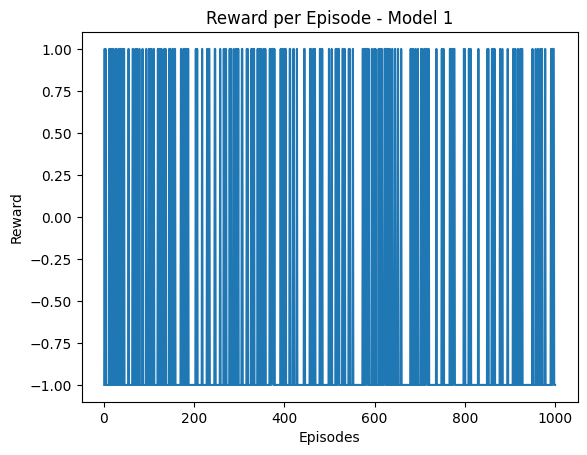

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN) + 1),rewards_per_episode_NN)
plt.title('Reward per Episode - Model 1')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

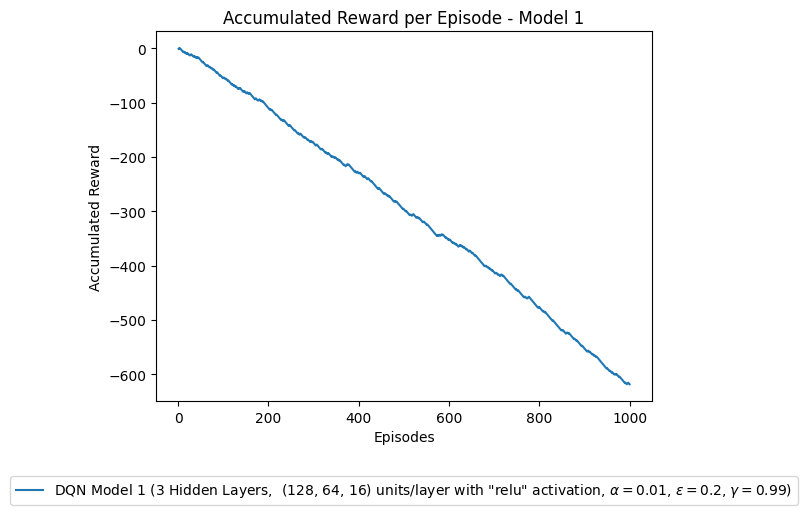

In [ ]:
rewards_per_episode_NN_accum = np.cumsum(rewards_per_episode_NN)
plt.plot(np.arange(1, len(rewards_per_episode_NN_accum) + 1), rewards_per_episode_NN_accum)
plt.title('Accumulated Reward per Episode - Model 1')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [r'DQN Model 1 (3 Hidden Layers,  (128, 64, 16) units/layer with "relu" activation, $\alpha = 0.01$, $\epsilon = 0.2$, $\gamma = 0.99$)']
plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### Model 2

- 2 Hidden Layers
    - Number of units: (50, 10).
    - Activation Function: "relu"
- 1 output layer
    - Number of units: 1.
    - Activation Function: "linear"
- learning_rate = **0.0025**
- epsilon = **0.1**
- discount = 0.99
- **Comment :** when we reduced the learning rate 𝞪 to 0.0025 instead of 0.01 the model converged inspite of being less complex than Model 1 so this confirms that the issue was with the learning rate. For the next model we will re-assess Model 1 convergence with the new learning rate 0.0025.

In [ ]:
# Create environment.
env = Catch()
learning_rate = 0.0025

#To Do:
# Build model for agent.

model2 = Sequential()
model2.add(tf.keras.layers.Input(shape=(53,)))
model2.add(Dense(50, input_dim =53, activation='relu', kernel_initializer='he_uniform')) # input_dim will be 50+3
model2.add(Dense(10, activation='relu', kernel_initializer='he_uniform'))
model2.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))

model2.summary()
model2.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNN(model2, epsilon=0.1, discount=0.99)


Model: "sequential_2"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense_7 (Dense)             (None, 50)                2700      

                                                                 

 dense_8 (Dense)             (None, 10)                510       

                                                                 

 dense_9 (Dense)             (None, 1)                 11        

                                                                 


Total params: 3,221

Trainable params: 3,221

Non-trainable params: 0

_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
    rewards_per_episode_NN_model2 = train(agent, env, num_episodes=1000)
    res2 = evaluate(agent, env)

Training agent...

Episode: 0, Return: 1.0, Mean return: 1.0

Episode: 10, Return: -1.0, Mean return: -0.45454545454545453

Episode: 20, Return: 1.0, Mean return: -0.23809523809523808

Episode: 30, Return: -1.0, Mean return: -0.16129032258064516

Episode: 40, Return: -1.0, Mean return: -0.17073170731707318

Episode: 50, Return: 1.0, Mean return: -0.16

Episode: 60, Return: -1.0, Mean return: -0.04

Episode: 70, Return: -1.0, Mean return: -0.12

Episode: 80, Return: -1.0, Mean return: -0.2

Episode: 90, Return: -1.0, Mean return: -0.32

Episode: 100, Return: 1.0, Mean return: -0.32

Episode: 110, Return: 1.0, Mean return: -0.36

Episode: 120, Return: 1.0, Mean return: -0.36

Episode: 130, Return: 1.0, Mean return: -0.28

Episode: 140, Return: 1.0, Mean return: -0.08

Episode: 150, Return: -1.0, Mean return: -0.16

Episode: 160, Return: -1.0, Mean return: -0.08

Episode: 170, Return: 1.0, Mean return: -0.04

Episode: 180, Return: -1.0, Mean return: -0.04

Episode: 190, Return: 1.0, Mean 

In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res2.pkl', 'wb') as f:  # open a file
    pk.dump(res2, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res2.pkl', 'rb') as f:
    res2 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res2[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim2 = animation.FuncAnimation(plt.gcf(), animate, frames=res2, blit=False, repeat=True)

In [ ]:
anim2

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_model2.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN_model2, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_model2.pkl', 'rb') as f:
    rewards_per_episode_NN_model2 = pk.load(f) # deserialize using load()
    #print(len(rewards_per_episode_NN_model2)) # print list length for checking purposes
f.close()

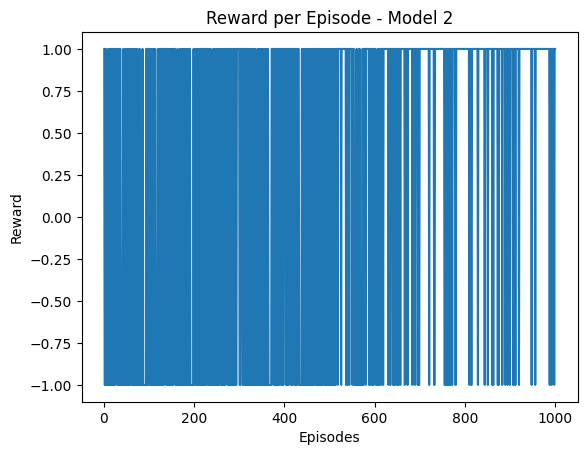

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_model2) + 1),rewards_per_episode_NN_model2)
plt.title('Reward per Episode - Model 2')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

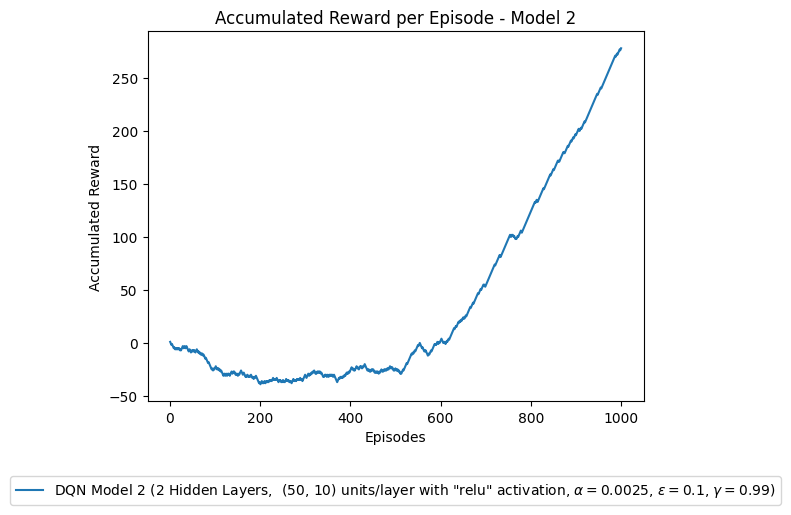

In [ ]:
rewards_per_episode_NN_model2_accum = np.cumsum(rewards_per_episode_NN_model2)
plt.plot(np.arange(1, len(rewards_per_episode_NN_model2_accum) + 1), rewards_per_episode_NN_model2_accum)
plt.title('Accumulated Reward per Episode - Model 2')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [r'DQN Model 2 (2 Hidden Layers,  (50, 10) units/layer with "relu" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)']
plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### Model 3

- 3 Hidden Layers
    - Number of units: (128, 64, 16).
    - Activation Function: "relu"
- 1 output layer
    - Number of units: 1.
    - Activation Function: "linear"
- learning_rate = **0.0025**
- epsilon = 0.1
- discount = 0.99
- **Comment :** The model converged with the new learning rate 0.0025 and also it converged faster than Model 2 which indicates that Model 2 was simple for the problem. For the next trial we will try another complex model but this time we will increase the number of units per layer and use lesser number of layers (just 2) instead of increasing the number of layers and using lesser units as we did in Model 3. We will aslso try changing the activation function of the hidden units to "Softplus" instead of "Relu".

In [ ]:
# Create environment.
env = Catch()
learning_rate = 0.0025

#To Do:
# Build model for agent.

model3 = Sequential()
model3.add(tf.keras.layers.Input(shape=(53,)))
model3.add(Dense(128, input_dim =53, activation='relu', kernel_initializer='he_uniform')) # input_dim will be 50+3
model3.add(Dense(64, activation='relu', kernel_initializer='he_uniform'))
model3.add(Dense(16, activation='relu', kernel_initializer='he_uniform'))
model3.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))

#model.build(input_shape = (53,))
model3.summary()
model3.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNN(model3, epsilon=0.1, discount=0.99)


Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense (Dense)               (None, 128)               6912      

                                                                 

 dense_1 (Dense)             (None, 64)                8256      

                                                                 

 dense_2 (Dense)             (None, 16)                1040      

                                                                 

 dense_3 (Dense)             (None, 1)                 17        

                                                                 


Total params: 16,225

Trainable params: 16,225

Non-trainable params: 0

_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
    rewards_per_episode_NN_model3 = train(agent, env, num_episodes=1000)
    res3 = evaluate(agent, env)

Training agent...

Episode: 0, Return: 1.0, Mean return: 1.0

Episode: 10, Return: -1.0, Mean return: -0.8181818181818182

Episode: 20, Return: 1.0, Mean return: -0.5238095238095238

Episode: 30, Return: 1.0, Mean return: -0.6129032258064516

Episode: 40, Return: 1.0, Mean return: -0.5121951219512195

Episode: 50, Return: -1.0, Mean return: -0.44

Episode: 60, Return: 1.0, Mean return: -0.2

Episode: 70, Return: 1.0, Mean return: -0.16

Episode: 80, Return: 1.0, Mean return: -0.08

Episode: 90, Return: -1.0, Mean return: -0.04

Episode: 100, Return: -1.0, Mean return: -0.12

Episode: 110, Return: -1.0, Mean return: -0.24

Episode: 120, Return: 1.0, Mean return: -0.32

Episode: 130, Return: 1.0, Mean return: -0.24

Episode: 140, Return: 1.0, Mean return: -0.28

Episode: 150, Return: 1.0, Mean return: -0.16

Episode: 160, Return: -1.0, Mean return: -0.08

Episode: 170, Return: -1.0, Mean return: 0.08

Episode: 180, Return: 1.0, Mean return: 0.04

Episode: 190, Return: 1.0, Mean return: 0

In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res3.pkl', 'wb') as f:  # open a file
    pk.dump(res3, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res3.pkl', 'rb') as f:
    res3 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res3[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim3 = animation.FuncAnimation(plt.gcf(), animate, frames=res3, blit=False, repeat=True)

In [ ]:
anim3

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_model3.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN_model3, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_model3.pkl', 'rb') as f:
    rewards_per_episode_NN_model3 = pk.load(f) # deserialize using load()
    #print(len(rewards_per_episode_NN_model3)) # print list length for checking purposes
f.close()

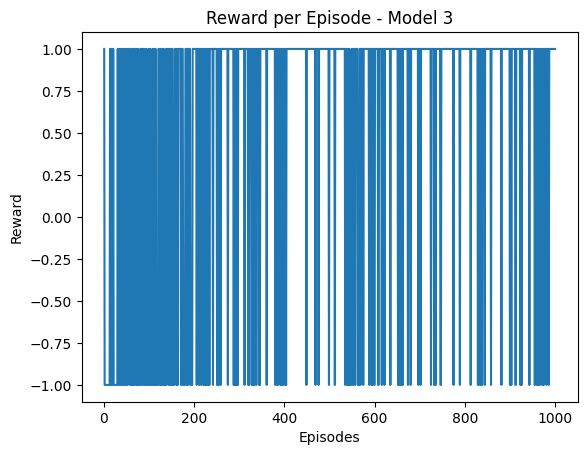

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_model3) + 1),rewards_per_episode_NN_model3)
plt.title('Reward per Episode - Model 3')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

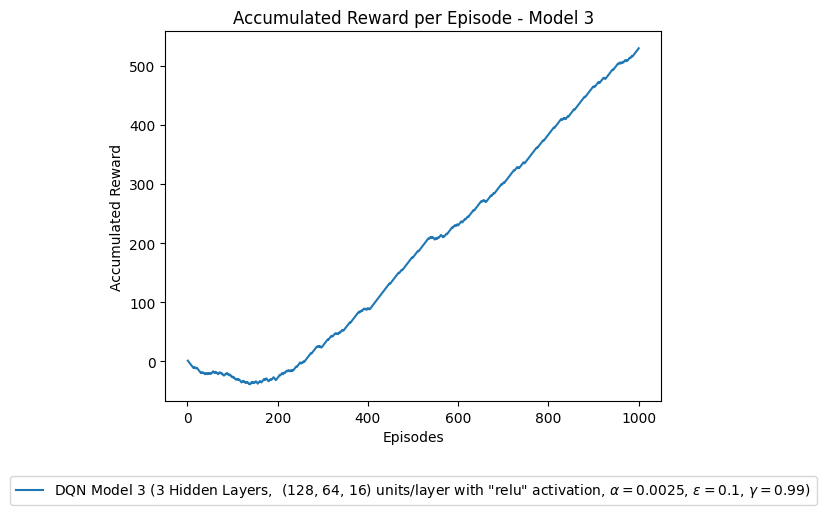

In [ ]:
rewards_per_episode_NN_model3_accum = np.cumsum(rewards_per_episode_NN_model3)
plt.plot(np.arange(1, len(rewards_per_episode_NN_model3_accum) + 1), rewards_per_episode_NN_model3_accum)
plt.title('Accumulated Reward per Episode - Model 3')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [r'DQN Model 3 (3 Hidden Layers,  (128, 64, 16) units/layer with "relu" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)']
plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### Model 4

- 2 Hidden Layers
    - Number of units: (128, 256).
    - Activation Function: "**softplus**"
- 1 output layer
    - Number of units: 1.
    - Activation Function: "linear"
- learning_rate = 0.0025
- epsilon = 0.1
- discount = 0.99
- **Comment :** The model didn't converge and since we have previously used 2 hidden layer model as in Model 2 which converged inspite of having lesser number of units (50,10) compared to this model (128,256) we doubted that maybe the activation function of "Softplus" is the cause of divergence as this is the only significant change so for the next model trial we will re-assess the current model Model 4 but using "Relu" activation function for the hidden units instead of the "Softplus".

In [ ]:
# Create environment.
env = Catch()
# action_size = env.action_spec().num_values # 3 actions
learning_rate = 0.0025

#To Do:
# Build model for agent.

model4 = Sequential()
model4.add(tf.keras.layers.Input(shape=(53,)))
model4.add(Dense(128, input_dim =53, activation='softplus', kernel_initializer='he_uniform')) # input_dim will be 50+3
model4.add(Dense(256, activation='softplus', kernel_initializer='he_uniform'))
model4.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))

#model.build(input_shape = (53,))
model4.summary()
model4.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNN(model4, epsilon=0.1, discount=0.99)


Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense (Dense)               (None, 128)               6912      

                                                                 

 dense_1 (Dense)             (None, 256)               33024     

                                                                 

 dense_2 (Dense)             (None, 1)                 257       

                                                                 


Total params: 40,193

Trainable params: 40,193

Non-trainable params: 0

_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
    rewards_per_episode_NN_model4 = train(agent, env, num_episodes=1000)
    res4 = evaluate(agent, env)

Training agent...

Episode: 0, Return: -1.0, Mean return: -1.0

Episode: 10, Return: -1.0, Mean return: -0.6363636363636364

Episode: 20, Return: -1.0, Mean return: -0.7142857142857143

Episode: 30, Return: -1.0, Mean return: -0.7419354838709677

Episode: 40, Return: 1.0, Mean return: -0.5609756097560976

Episode: 50, Return: -1.0, Mean return: -0.56

Episode: 60, Return: -1.0, Mean return: -0.56

Episode: 70, Return: -1.0, Mean return: -0.56

Episode: 80, Return: -1.0, Mean return: -0.52

Episode: 90, Return: -1.0, Mean return: -0.68

Episode: 100, Return: -1.0, Mean return: -0.68

Episode: 110, Return: 1.0, Mean return: -0.68

Episode: 120, Return: 1.0, Mean return: -0.68

Episode: 130, Return: -1.0, Mean return: -0.68

Episode: 140, Return: -1.0, Mean return: -0.68

Episode: 150, Return: -1.0, Mean return: -0.68

Episode: 160, Return: -1.0, Mean return: -0.68

Episode: 170, Return: 1.0, Mean return: -0.64

Episode: 180, Return: -1.0, Mean return: -0.6

Episode: 190, Return: -1.0, Me

In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res4.pkl', 'wb') as f:  # open a file
    pk.dump(res4, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res4.pkl', 'rb') as f:
    res4 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res4[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim4 = animation.FuncAnimation(plt.gcf(), animate, frames=res4, blit=False, repeat=True)

In [ ]:
anim4

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_model4.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN_model4, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_model4.pkl', 'rb') as f:
    rewards_per_episode_NN_model4 = pk.load(f) # deserialize using load()
    #print(len(rewards_per_episode_NN_model4)) # print list length for checking purposes
f.close()

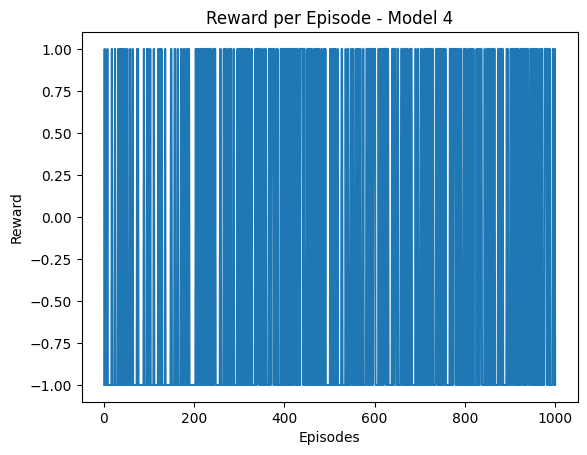

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_model4) + 1),rewards_per_episode_NN_model4)
plt.title('Reward per Episode - Model 4')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

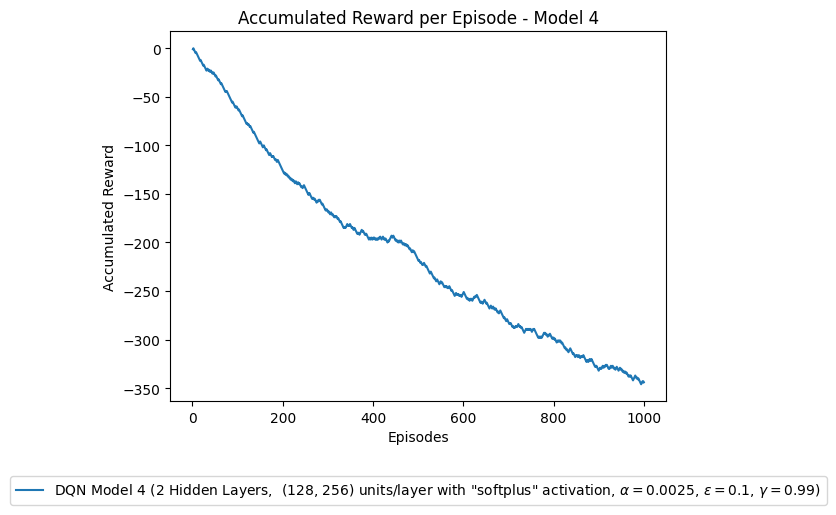

In [ ]:
rewards_per_episode_NN_model4_accum = np.cumsum(rewards_per_episode_NN_model4)
plt.plot(np.arange(1, len(rewards_per_episode_NN_model4_accum) + 1), rewards_per_episode_NN_model4_accum)
plt.title('Accumulated Reward per Episode - Model 4')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [r'DQN Model 4 (2 Hidden Layers,  (128, 256) units/layer with "softplus" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)']
plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### Model 5

- 2 Hidden Layers
    - Number of units: (128, 256).
    - Activation Function: "**relu**"
- 1 output layer
    - Number of units: 1.
    - Activation Function: "linear"
- learning_rate = 0.0025
- epsilon = 0.1
- discount = 0.99
- **Comment :** The model converged when we used the "Relu" activation function comapred to Model 4 which has the same architecture as this Model 5 but uses "Softplus" as activation for hidden layers. This Model 5 is also the fastest model to converge in all the tried NN agents even when we comapre it with the tabular Q learning also it has the largest accumulated reward at the 1000th episode this may suggest that this probelm of Catch Environment needs higher number of units per layer (width of NN) compared to number the number of used layers (depth of NN) as this is the widdest model used compared to other models that converged such as Model 2 and Model 3. Model 2 is the least in depth and width. Model 3 is the deepest model used.

In [ ]:
# Create environment.
env = Catch()
# action_size = env.action_spec().num_values # 3 actions
learning_rate = 0.0025

#To Do:
# Build model for agent.

model5 = Sequential()
model5.add(tf.keras.layers.Input(shape=(53,)))
model5.add(Dense(128, input_dim =53, activation='relu', kernel_initializer='he_uniform')) # input_dim will be 50+3
model5.add(Dense(256, activation='relu', kernel_initializer='he_uniform'))
model5.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))

#model.build(input_shape = (53,))
model5.summary()
model5.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNN(model5, epsilon=0.1, discount=0.99)


Model: "sequential_1"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense_3 (Dense)             (None, 128)               6912      

                                                                 

 dense_4 (Dense)             (None, 256)               33024     

                                                                 

 dense_5 (Dense)             (None, 1)                 257       

                                                                 


Total params: 40,193

Trainable params: 40,193

Non-trainable params: 0

_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
    rewards_per_episode_NN_model5 = train(agent, env, num_episodes=1000)
    res5 = evaluate(agent, env)

Training agent...

Episode: 0, Return: -1.0, Mean return: -1.0

Episode: 10, Return: 1.0, Mean return: -0.2727272727272727

Episode: 20, Return: 1.0, Mean return: -0.14285714285714285

Episode: 30, Return: 1.0, Mean return: -0.3548387096774194

Episode: 40, Return: -1.0, Mean return: -0.21951219512195122

Episode: 50, Return: -1.0, Mean return: -0.2

Episode: 60, Return: -1.0, Mean return: -0.16

Episode: 70, Return: -1.0, Mean return: -0.2

Episode: 80, Return: -1.0, Mean return: 0.0

Episode: 90, Return: -1.0, Mean return: -0.16

Episode: 100, Return: 1.0, Mean return: -0.16

Episode: 110, Return: 1.0, Mean return: -0.24

Episode: 120, Return: 1.0, Mean return: -0.2

Episode: 130, Return: 1.0, Mean return: -0.16

Episode: 140, Return: 1.0, Mean return: 0.12

Episode: 150, Return: 1.0, Mean return: 0.24

Episode: 160, Return: 1.0, Mean return: 0.52

Episode: 170, Return: 1.0, Mean return: 0.64

Episode: 180, Return: -1.0, Mean return: 0.52

Episode: 190, Return: 1.0, Mean return: 0.4


In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res5.pkl', 'wb') as f:  # open a file
    pk.dump(res5, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res5.pkl', 'rb') as f:
    res5 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res5[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim5 = animation.FuncAnimation(plt.gcf(), animate, frames=res5, blit=False, repeat=True)

In [ ]:
anim5

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_model5.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN_model5, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_model5.pkl', 'rb') as f:
    rewards_per_episode_NN_model5 = pk.load(f) # deserialize using load()
    #print(len(rewards_per_episode_NN_model4)) # print list length for checking purposes
f.close()

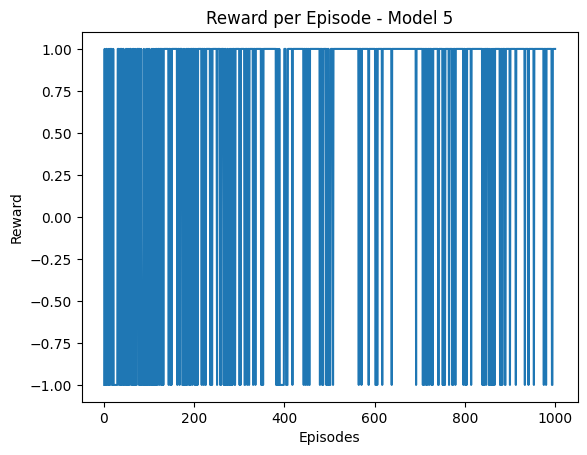

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_model5) + 1),rewards_per_episode_NN_model5)
plt.title('Reward per Episode - Model 5')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

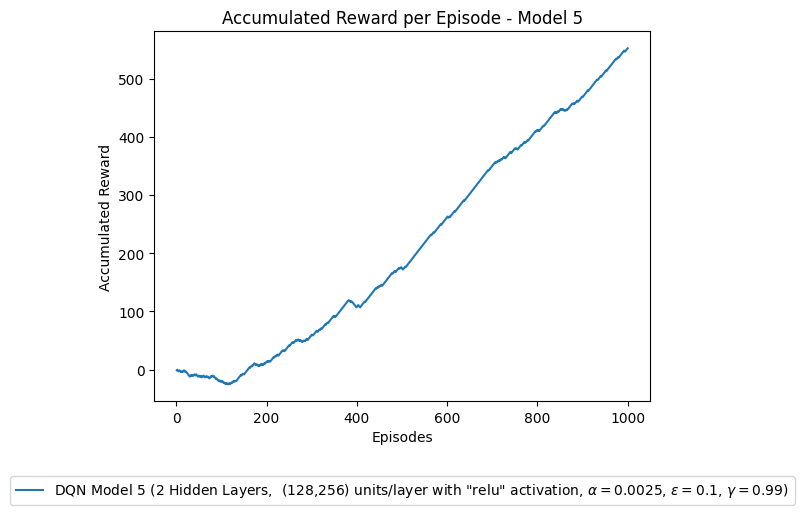

In [ ]:
rewards_per_episode_NN_model5_accum = np.cumsum(rewards_per_episode_NN_model5)
plt.plot(np.arange(1, len(rewards_per_episode_NN_model5_accum) + 1), rewards_per_episode_NN_model5_accum)
plt.title('Accumulated Reward per Episode - Model 5')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [r'DQN Model 5 (2 Hidden Layers,  (128,256) units/layer with "relu" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)']
plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### NNs Q learning Agents Models Convergence Curves Comparison

In [ ]:
# calculating the accumulated reward per epsiode for different tried models to compare their performance
rewards_per_episode_accum = np.cumsum(rewards_per_episode)
rewards_per_episode_NN_accum = np.cumsum(rewards_per_episode_NN)
rewards_per_episode_NN_model2_accum = np.cumsum(rewards_per_episode_NN_model2)
rewards_per_episode_NN_model3_accum = np.cumsum(rewards_per_episode_NN_model3)
rewards_per_episode_NN_model4_accum = np.cumsum(rewards_per_episode_NN_model4)
rewards_per_episode_NN_model5_accum = np.cumsum(rewards_per_episode_NN_model5)

Converged Models

- Model 2
- Model 3
- Model 5

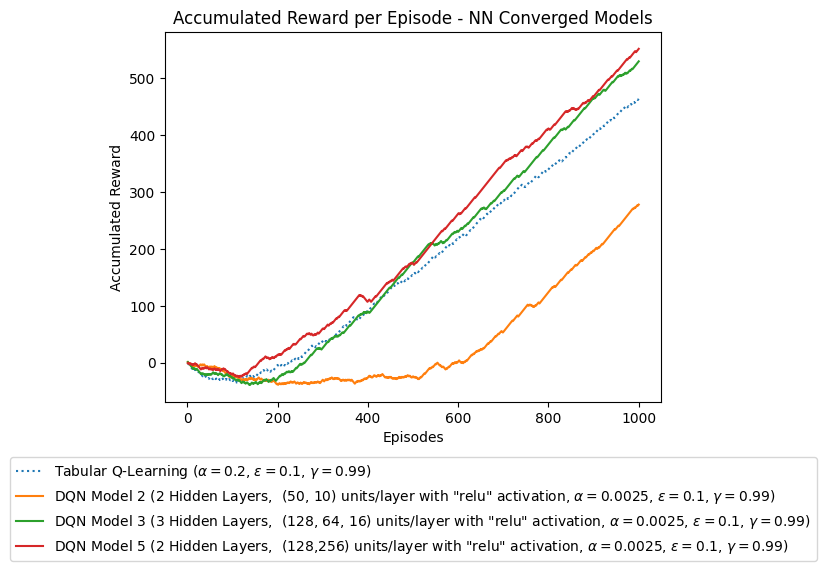

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_accum) + 1), rewards_per_episode_accum,':' ,label= r'Tabular Q-Learning ($\alpha = 0.2$, $\epsilon = 0.1$, $\gamma = 0.99$)')
plt.plot(np.arange(1, len(rewards_per_episode_NN_model2_accum) + 1), rewards_per_episode_NN_model2_accum, label = r'DQN Model 2 (2 Hidden Layers,  (50, 10) units/layer with "relu" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)' )
plt.plot(np.arange(1, len(rewards_per_episode_NN_model3_accum) + 1), rewards_per_episode_NN_model3_accum, label = r'DQN Model 3 (3 Hidden Layers,  (128, 64, 16) units/layer with "relu" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)')
plt.plot(np.arange(1, len(rewards_per_episode_NN_model5_accum) + 1), rewards_per_episode_NN_model5_accum, label = r'DQN Model 5 (2 Hidden Layers,  (128,256) units/layer with "relu" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)')

plt.title('Accumulated Reward per Episode - NN Converged Models')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
plt.legend(loc = 'lower center', bbox_to_anchor = (0.5,-0.45,0,0))
plt.show()

Diverged Models

- Model 1: Due to high learning rate **𝞪 = 0.01** when using adam optimizer.
- Model 4: Due to using "**Softplus**" activation function for the hidden units instead of "**Relu**".

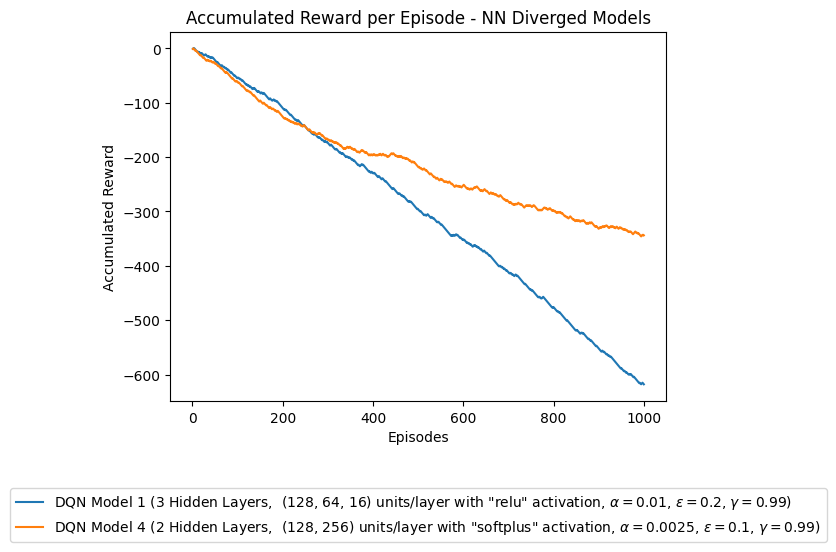

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_accum) + 1), rewards_per_episode_NN_accum, label = r'DQN Model 1 (3 Hidden Layers,  (128, 64, 16) units/layer with "relu" activation, $\alpha = 0.01$, $\epsilon = 0.2$, $\gamma = 0.99$)')
plt.plot(np.arange(1, len(rewards_per_episode_NN_model4_accum) + 1), rewards_per_episode_NN_model4_accum, label = r'DQN Model 4 (2 Hidden Layers,  (128, 256) units/layer with "softplus" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)')

plt.title('Accumulated Reward per Episode - NN Diverged Models')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
plt.legend(loc = 'lower center', bbox_to_anchor = (0.5,-0.4,0,0))
plt.show()

## 3. Q-Learning agent with NNs and a Replay Buffer

Another way we can make our algorithm more efficient is by introducing a *Replay Buffer*. In the previous example, each `model.fit` method was called on a single transition (the very last one). Instead of fitting on a single datapoint, we can fit on a *set* of datapoints. To do this, we store a number of previously seen transitions $(S_i, a_i, S_{i+1})$ and at each update we fit the model on sample of these.

In [ ]:
class QLearningNNReplay(Agent):
  """Simple Q-learning agent using a Neural Network and a replay buffer."""

  def __init__(self,
               model,
               max_replay_entries: int = 10000,
               num_samples_per_update: int = 10,
               epsilon: float = 0.1,
               discount: float = 0.99):
    self._model = model
    self._replay = []
    self._max_replay_entries = max_replay_entries
    self._num_samples_per_update = num_samples_per_update
    self._epsilon = epsilon
    self._discount = discount
    self._latest_action = None
    self._timestep_before_action = None
    self._timestep_after_action = None


  def observe_first(self, first_timestep: dm_env.TimeStep):
    self._timestep_after_action = first_timestep


  def observe(self, action, next_timestep):
    self._latest_action = action
    self._timestep_before_action = self._timestep_after_action
    self._timestep_after_action = next_timestep
    # Add (S_i, a_i, S_i+1) to replay buffer.
    self._replay.append((self._timestep_before_action, self._latest_action,
                         self._timestep_after_action))
    if len(self._replay) >= self._max_replay_entries:
      # Remove a random entry from the buffer if capacity is reached.
      random_index = np.random.randint(len(self._replay))
      del self._replay[random_index]


  def _best_action(self, obs):
    return np.argmax([self._q_func(obs, a) for a in range(3)])


  def update(self):
    #To-Do
    #Create a function that update Q-values based on NN with Replay Buffer
    if len(self._replay) < self._num_samples_per_update:
        return

    minibatch = random.sample(self._replay, self._num_samples_per_update) # Sample `self._num_samples_per_update` from replay buffer.

    for sample in minibatch:

        obs_before = sample[0].observation # initialize obs before taking the action
        action_taken = sample[1] # the action taken
        reward = sample[2].reward # initialize reward
        obs = sample[2].observation # initialize obs after taking the action
        done = sample[2].last()

        best_action = self._best_action(obs) # initialzie best action to take at the next state
        td = reward + (1-done) * self._discount * self._q_func(obs, best_action) # initialize target output

        # initalize model input using "_make_input" to be able to give it to neural netwrok
        model_input = self._make_input(obs_before,action_taken)
        model_input = model_input.reshape(-1,len(model_input))

        # use model.fit to fit the model to the target td we are creating
        self._model.fit(model_input, td, epochs=1, verbose=0)


  def _make_input(self, obs, action):
    flatten_obs = tf.reshape(obs, shape=(tf.math.reduce_prod(obs.shape)))
    a = np.zeros([3])
    a[action] = 1  # One-hot action
    model_input = tf.concat([flatten_obs, a], axis=0) # Concatenate them
    return model_input


  def _q_func(self, latest_obs, action):
    #To Do:
    #Write a q_func method to compute the Q-value as the output of the NN model
    model_input = self._make_input(latest_obs,action)

    model_input = model_input.reshape(-1,len(model_input))
    output = self._model(model_input).numpy() #to get q values output
    #.predict,  verbose=0
    return output


  def select_action(self, latest_obs):
     #To Do:
    #Write the method for action selection. Its similar to the QLearning agent action selection method!
    if np.random.random() < self._epsilon:
        action = np.random.randint(0,3)
    else:
        action = np.argmax([self._q_func(latest_obs, a) for a in range(3)])

    return action


  def set_epsilon(self, eps: float):
    self._epsilon = eps

### Train Q-learning agent with NNs and replay buffer

### Experiments

Experiment with Replay Buffer settings:
* Modify the sampling method (e.g. give higher priority to recent items instead of sampling uniformly)
* Change the eviction strategy
* Change the size of the replay buffer (i.e. the maximum number of entries)
* Change the size of the samples.


From the previous expermentation with the NN Q learning agents we concluded that Model 5 was the fastest model to converge and it also had the highest accumulated reward at the end of the learning epsiodes compared with the rest of tried models so we decided to use the same NN model architecture here to guarantee convergence when we experiment with adding the replay buffer and its different settings to the DQN agents.

The neural network function approximation model used during this section is summarized below.

- 2 Hidden Layers
    - Number of units: (128, 256).
    - Activation Function: "**relu**"
- 1 output layer
    - Number of units: 1.
    - Activation Function: "linear"
- learning_rate = 0.0025
- epsilon = 0.1
- discount = 0.99

Each of the below tried models with replay buffer will differ in the replay buffer settings such as the maximum size or memory of the buffer and the batch size of samples used to update the model.

Each model was trained for 330 episodes instead of 1000 as we did with the models without the replay buffer due to the increased training time.


#### Model 1 using Replay Buffer

For the first model we started with a small buffer size and update batch size given below to chek how fast or slow is the convergence.
- max buffer size = 100 samples
- model update batch size = 10 samples

**Comment :** The model was too slow reaching convergence so in the next trail we will increase the maximum buffer size and check the performance.

In [ ]:
# Create environment.
env = Catch()

learning_rate = 0.0025

#To Do:
# Build model for agent.

model_buffer_1 = Sequential()
model_buffer_1.add(tf.keras.layers.Input(shape=(53,)))
model_buffer_1.add(Dense(128, input_dim =53, activation='relu', kernel_initializer='he_uniform')) # input_dim will be 50+3
model_buffer_1.add(Dense(256, activation='relu', kernel_initializer='he_uniform'))
model_buffer_1.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))

#model.build(input_shape = (53,))
model_buffer_1.summary()
model_buffer_1.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNNReplay(model_buffer_1, max_replay_entries=100, num_samples_per_update=10, epsilon=0.1, discount=0.99)

Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense (Dense)               (None, 128)               6912      

                                                                 

 dense_1 (Dense)             (None, 256)               33024     

                                                                 

 dense_2 (Dense)             (None, 1)                 257       

                                                                 


Total params: 40,193

Trainable params: 40,193

Non-trainable params: 0

_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
  rewards_per_episode_NN_buffer_model_1 = train(agent, env, num_episodes=330)
  res_buff_1 = evaluate(agent, env)

Training agent...

Episode: 0, Return: -1.0, Mean return: -1.0

Episode: 10, Return: 1.0, Mean return: -0.45454545454545453

Episode: 20, Return: -1.0, Mean return: -0.42857142857142855

Episode: 30, Return: 1.0, Mean return: -0.3548387096774194

Episode: 40, Return: -1.0, Mean return: -0.36585365853658536

Episode: 50, Return: 1.0, Mean return: -0.36

Episode: 60, Return: -1.0, Mean return: -0.32

Episode: 70, Return: -1.0, Mean return: -0.32

Episode: 80, Return: -1.0, Mean return: -0.4

Episode: 90, Return: -1.0, Mean return: -0.32

Episode: 100, Return: 1.0, Mean return: -0.2

Episode: 110, Return: -1.0, Mean return: -0.16

Episode: 120, Return: 1.0, Mean return: -0.16

Episode: 130, Return: 1.0, Mean return: -0.04

Episode: 140, Return: 1.0, Mean return: 0.04

Episode: 150, Return: 1.0, Mean return: 0.04

Episode: 160, Return: 1.0, Mean return: 0.08

Episode: 170, Return: -1.0, Mean return: 0.28

Episode: 180, Return: 1.0, Mean return: 0.24

Episode: 190, Return: 1.0, Mean return:

In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res_buff_1.pkl', 'wb') as f:  # open a file
    pk.dump(res_buff_1, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res_buff_1.pkl', 'rb') as f:
    res_buff_1 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res_buff_1[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim_buff_1 = animation.FuncAnimation(plt.gcf(), animate, frames=res_buff_1, blit=False, repeat=True)

In [ ]:
anim_buff_1

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_buffer_model_1.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN_buffer_model_1, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_buffer_model_1.pkl', 'rb') as f:
    rewards_per_episode_NN_buffer_model_1 = pk.load(f) # deserialize using load()
f.close()

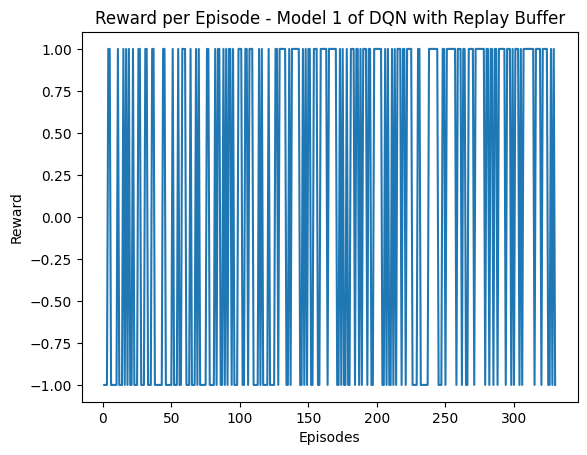

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_1) + 1),rewards_per_episode_NN_buffer_model_1)
plt.title('Reward per Episode - Model 1 of DQN with Replay Buffer')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

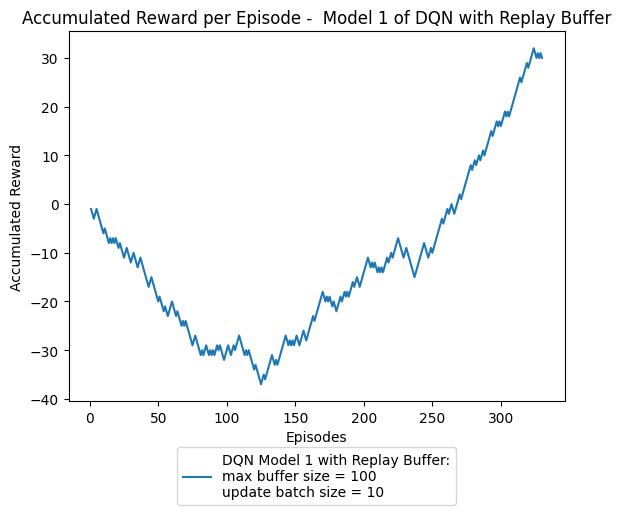

In [ ]:
rewards_per_episode_NN_buffer_model_1_accum = np.cumsum(rewards_per_episode_NN_buffer_model_1)
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_1_accum) + 1), rewards_per_episode_NN_buffer_model_1_accum)
plt.title('Accumulated Reward per Episode -  Model 1 of DQN with Replay Buffer')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [f'DQN Model 1 with Replay Buffer:\n'+
         f'max buffer size = 100\n' +
         f'update batch size = 10']

plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### Model 2 using Replay Buffer

In this model we increased maximum buffer size to 10,000 instead of 100 and kept the model update batch size fixed at 10.

- max buffer size = 10,000
- update batch size = 10

**Comment :** The model converged faster than the previous Model 1 so we can conclude that increasing the maximum buffer size makes the learning faster. This can be due to the buffer being filled with more diverse and different experiences that we sample from and update the model with, which have a positive impact on learning compared when we have limited saved experiences avaiable in which case we will unfortuantely keep sampling the same experiences we have seen before with minimum diversity.

In the next model we will keep the maximum buffer size fixed at 10,000 and will increase the model updating batch size to see its effect.

In [ ]:
# Create environment.
env = Catch()

learning_rate = 0.0025

#To Do:
# Build model for agent.

model_buffer_2 = Sequential()
model_buffer_2.add(tf.keras.layers.Input(shape=(53,)))
model_buffer_2.add(Dense(128, input_dim =53, activation='relu', kernel_initializer='he_uniform')) # input_dim will be 50+3
model_buffer_2.add(Dense(256, activation='relu', kernel_initializer='he_uniform'))
model_buffer_2.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))

#model.build(input_shape = (53,))
model_buffer_2.summary()
model_buffer_2.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNNReplay(model_buffer_2, max_replay_entries=10000, num_samples_per_update=10, epsilon=0.1, discount=0.99)

Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense (Dense)               (None, 128)               6912      

                                                                 

 dense_1 (Dense)             (None, 256)               33024     

                                                                 

 dense_2 (Dense)             (None, 1)                 257       

                                                                 


Total params: 40,193

Trainable params: 40,193

Non-trainable params: 0

_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
  rewards_per_episode_NN_buffer_model_2 = train(agent, env, num_episodes=330)
  res_buff_2 = evaluate(agent, env)

Training agent...

Episode: 0, Return: -1.0, Mean return: -1.0

Episode: 10, Return: -1.0, Mean return: -0.8181818181818182

Episode: 20, Return: -1.0, Mean return: -0.8095238095238095

Episode: 30, Return: -1.0, Mean return: -0.6774193548387096

Episode: 40, Return: -1.0, Mean return: -0.5609756097560976

Episode: 50, Return: -1.0, Mean return: -0.48

Episode: 60, Return: -1.0, Mean return: -0.36

Episode: 70, Return: 1.0, Mean return: -0.16

Episode: 80, Return: -1.0, Mean return: -0.04

Episode: 90, Return: -1.0, Mean return: 0.0

Episode: 100, Return: 1.0, Mean return: 0.12

Episode: 110, Return: 1.0, Mean return: 0.24

Episode: 120, Return: 1.0, Mean return: 0.32

Episode: 130, Return: 1.0, Mean return: 0.44

Episode: 140, Return: 1.0, Mean return: 0.64

Episode: 150, Return: 1.0, Mean return: 0.76

Episode: 160, Return: 1.0, Mean return: 0.84

Episode: 170, Return: 1.0, Mean return: 0.84

Episode: 180, Return: 1.0, Mean return: 0.84

Episode: 190, Return: 1.0, Mean return: 0.84



In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res_buff_2.pkl', 'wb') as f:  # open a file
    pk.dump(res_buff_2, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res_buff_2.pkl', 'rb') as f:
    res_buff_2 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res_buff_2[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim_buff_2 = animation.FuncAnimation(plt.gcf(), animate, frames=res_buff_2, blit=False, repeat=True)

In [ ]:
anim_buff_2

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_buffer_model_2.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN_buffer_model_2, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_buffer_model_2.pkl', 'rb') as f:
    rewards_per_episode_NN_buffer_model_2 = pk.load(f) # deserialize using load()
f.close()

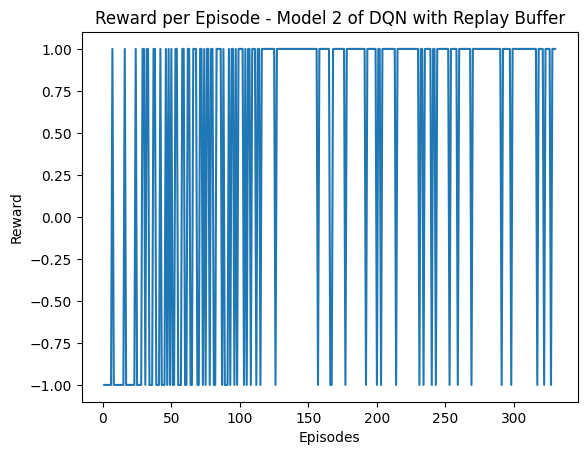

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_2) + 1),rewards_per_episode_NN_buffer_model_2)
plt.title('Reward per Episode - Model 2 of DQN with Replay Buffer')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

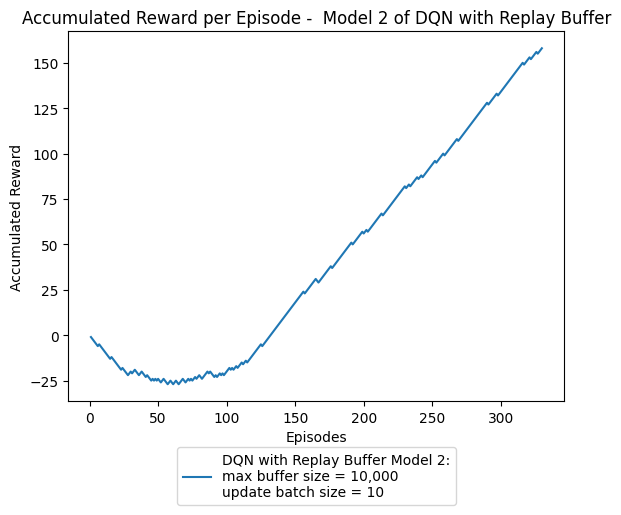

In [ ]:
rewards_per_episode_NN_buffer_model_2_accum = np.cumsum(rewards_per_episode_NN_buffer_model_2)
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_2_accum) + 1), rewards_per_episode_NN_buffer_model_2_accum)
plt.title('Accumulated Reward per Episode -  Model 2 of DQN with Replay Buffer')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [f'DQN with Replay Buffer Model 2:\n'+
         f'max buffer size = 10,000\n' +
         f'update batch size = 10']

plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### Model 3 using Replay Buffer

In this trial we kept the maximum buffer size fixed at 10,000 and increased the batch size of model updating to 20.
- max buffer size = 10,000
- update batch size = 20

**Comment :** We were expecting that the convergence should be faster as we are training with more samples in each episode compared with the previous model that used batch size of 10. The actual result was that the convergence time was approximately the same for Model 3 and Model 2 however Model 3 at the begining of training had larger accumulated reward but at the end of the training episodes Model 2 surpassed Model 3 and had a larger accumulated reward.

To be able to judge better the effect of the batch size we decided to make another trail but now we will use a lesser batch size of just 3 which is the smallest batch size used (Model 2 : 10, Model 3 : 20) and will keep the maximum buffer size to 10,000.

In [ ]:
# Create environment.
env = Catch()

learning_rate = 0.0025

#To Do:
# Build model for agent.

model_buffer_3 = Sequential()
model_buffer_3.add(tf.keras.layers.Input(shape=(53,)))
model_buffer_3.add(Dense(128, input_dim =53, activation='relu', kernel_initializer='he_uniform')) # input_dim will be 50+3
model_buffer_3.add(Dense(256, activation='relu', kernel_initializer='he_uniform'))
model_buffer_3.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))

#model.build(input_shape = (53,))
model_buffer_3.summary()
model_buffer_3.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNNReplay(model_buffer_3, max_replay_entries=10000, num_samples_per_update=20, epsilon=0.1, discount=0.99)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               6912      
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 40,193
Trainable params: 40,193
Non-trainable params: 0
_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
  rewards_per_episode_NN_buffer_model_3 = train(agent, env, num_episodes=330)
  res_buff_3 = evaluate(agent, env)

Training agent...
Episode: 0, Return: -1.0, Mean return: -1.0
Episode: 10, Return: -1.0, Mean return: -0.8181818181818182
Episode: 20, Return: -1.0, Mean return: -0.6190476190476191
Episode: 30, Return: 1.0, Mean return: -0.41935483870967744
Episode: 40, Return: -1.0, Mean return: -0.2682926829268293
Episode: 50, Return: 1.0, Mean return: -0.24
Episode: 60, Return: -1.0, Mean return: 0.0
Episode: 70, Return: -1.0, Mean return: 0.04
Episode: 80, Return: -1.0, Mean return: 0.12
Episode: 90, Return: -1.0, Mean return: 0.0
Episode: 100, Return: 1.0, Mean return: 0.12
Episode: 110, Return: 1.0, Mean return: 0.04
Episode: 120, Return: 1.0, Mean return: 0.2
Episode: 130, Return: 1.0, Mean return: 0.24
Episode: 140, Return: 1.0, Mean return: 0.48
Episode: 150, Return: -1.0, Mean return: 0.48
Episode: 160, Return: 1.0, Mean return: 0.6
Episode: 170, Return: -1.0, Mean return: 0.56
Episode: 180, Return: -1.0, Mean return: 0.52
Episode: 190, Return: -1.0, Mean return: 0.4
Episode: 200, Return: 1.

In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res_buff_3.pkl', 'wb') as f:  # open a file
    pk.dump(res_buff_3, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res_buff_3.pkl', 'rb') as f:
    res_buff_3 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res_buff_3[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim_buff_3 = animation.FuncAnimation(plt.gcf(), animate, frames=res_buff_3, blit=False, repeat=True)

In [ ]:
anim_buff_3

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_buffer_model_3.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN_buffer_model_3, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_buffer_model_3.pkl', 'rb') as f:
    rewards_per_episode_NN_buffer_model_3 = pk.load(f) # deserialize using load()
f.close()

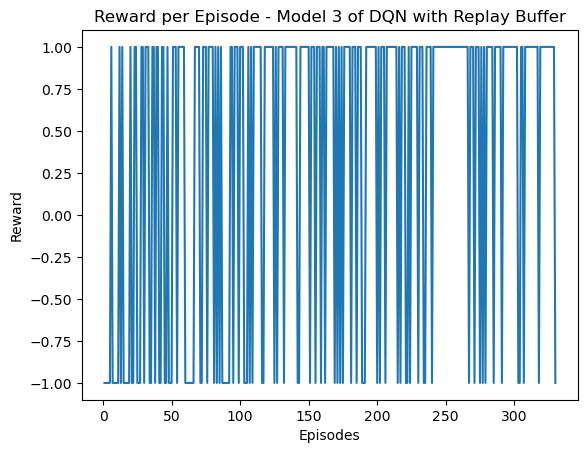

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_3) + 1),rewards_per_episode_NN_buffer_model_3)
plt.title('Reward per Episode - Model 3 of DQN with Replay Buffer')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

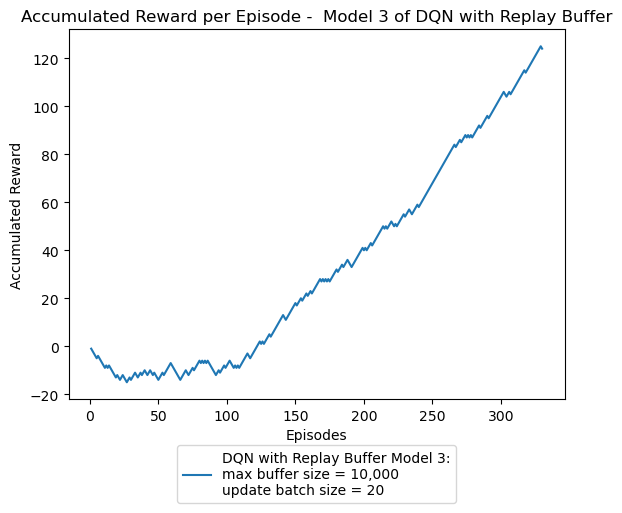

In [ ]:
rewards_per_episode_NN_buffer_model_3_accum = np.cumsum(rewards_per_episode_NN_buffer_model_3)
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_3_accum) + 1), rewards_per_episode_NN_buffer_model_3_accum)
plt.title('Accumulated Reward per Episode -  Model 3 of DQN with Replay Buffer')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [f'DQN with Replay Buffer Model 3:\n'+
         f'max buffer size = 10,000\n' +
         f'update batch size = 20']

plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### Model 4 using Replay Buffer

As mentioned before in this model we try using a very small model updating batch size of 3 to see the effect of it while keeping the used maximum buffer size to 10,000 for fair comparison with other models.

- max buffer size = 10,000
- update batch size = 3

**Comment :**
- When compared to Models 2,3 which used the same max buffer size of 10,000 but larger batch sizes (10,20) this Model 4 was the slowest to converge and it also had the lowest accumulated reward among them.

- But when compared to Model 1 which used a smaller max buffer size of 100 and larger batch size of 10 this Model 4 converged faster and had larger accumulated.

- From these results we conclude that the maximum buffer size is more significant in affecting the convergence time compared to the batch size. Where batch size can affect the total accumulated reward at the end of the traininig episodes.

In [ ]:
# Create environment.
env = Catch()

learning_rate = 0.0025

#To Do:
# Build model for agent.

model_buffer_4 = Sequential()
model_buffer_4.add(tf.keras.layers.Input(shape=(53,)))
model_buffer_4.add(Dense(128, input_dim =53, activation='relu', kernel_initializer='he_uniform')) # input_dim will be 50+3
model_buffer_4.add(Dense(256, activation='relu', kernel_initializer='he_uniform'))
model_buffer_4.add(Dense(1, activation='linear', kernel_initializer='he_uniform'))

#model.build(input_shape = (53,))
model_buffer_4.summary()
model_buffer_4.compile(loss='mse', optimizer=Adam(learning_rate))

# Create agent.
agent = QLearningNNReplay(model_buffer_4, max_replay_entries=10000, num_samples_per_update=3, epsilon=0.1, discount=0.99)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               6912      
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 40,193
Trainable params: 40,193
Non-trainable params: 0
_________________________________________________________________


In [ ]:
with tf.device('/device:GPU:0'):
  rewards_per_episode_NN_buffer_model_4 = train(agent, env, num_episodes=330)
  res_buff_4 = evaluate(agent, env)

Training agent...
Episode: 0, Return: -1.0, Mean return: -1.0
Episode: 10, Return: -1.0, Mean return: -0.6363636363636364
Episode: 20, Return: -1.0, Mean return: -0.5238095238095238
Episode: 30, Return: -1.0, Mean return: -0.41935483870967744
Episode: 40, Return: -1.0, Mean return: -0.3170731707317073
Episode: 50, Return: 1.0, Mean return: -0.36
Episode: 60, Return: -1.0, Mean return: -0.24
Episode: 70, Return: -1.0, Mean return: -0.2
Episode: 80, Return: 1.0, Mean return: -0.08
Episode: 90, Return: 1.0, Mean return: -0.04
Episode: 100, Return: 1.0, Mean return: 0.16
Episode: 110, Return: 1.0, Mean return: 0.36
Episode: 120, Return: -1.0, Mean return: 0.32
Episode: 130, Return: 1.0, Mean return: 0.2
Episode: 140, Return: -1.0, Mean return: 0.24
Episode: 150, Return: 1.0, Mean return: 0.16
Episode: 160, Return: -1.0, Mean return: -0.04
Episode: 170, Return: 1.0, Mean return: -0.04
Episode: 180, Return: 1.0, Mean return: 0.16
Episode: 190, Return: 1.0, Mean return: 0.2
Episode: 200, Retu

In [ ]:
# Saving evaluation result to a pickle file for later usage and animation
with open('res_buff_4.pkl', 'wb') as f:  # open a file
    pk.dump(res_buff_4, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('res_buff_4.pkl', 'rb') as f:
    res_buff_4 = pk.load(f) # deserialize using load()
f.close()

In [ ]:
#@title Render animation
%%capture
im = plt.imshow(res_buff_4[0])
def animate(frame):
  im.set_data(frame)
  return im,
anim_buff_4 = animation.FuncAnimation(plt.gcf(), animate, frames=res_buff_4, blit=False, repeat=True)

In [ ]:
anim_buff_4

In [ ]:
# Saving rewards data to a pickle file for later usage and plotting
with open('rewards_per_episode_NN_buffer_model_4.pkl', 'wb') as f:  # open a file
    pk.dump(rewards_per_episode_NN_buffer_model_4, f) # serialize the list
f.close()

In [ ]:
# Reading saved data
with open('rewards_per_episode_NN_buffer_model_4.pkl', 'rb') as f:
    rewards_per_episode_NN_buffer_model_4 = pk.load(f) # deserialize using load()
f.close()

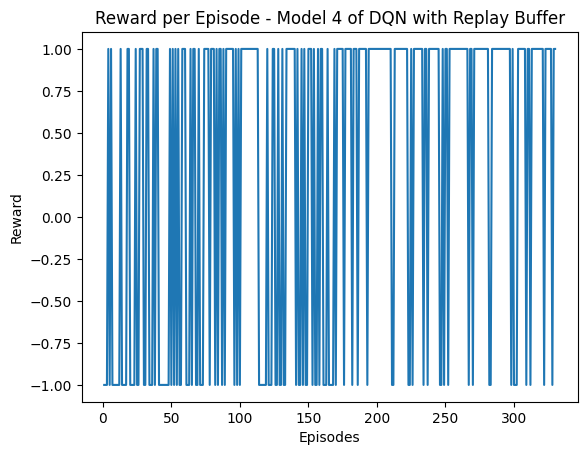

In [ ]:
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_4) + 1),rewards_per_episode_NN_buffer_model_4)
plt.title('Reward per Episode - Model 4 of DQN with Replay Buffer')
plt.xlabel('Episodes')
plt.ylabel('Reward')
plt.show()

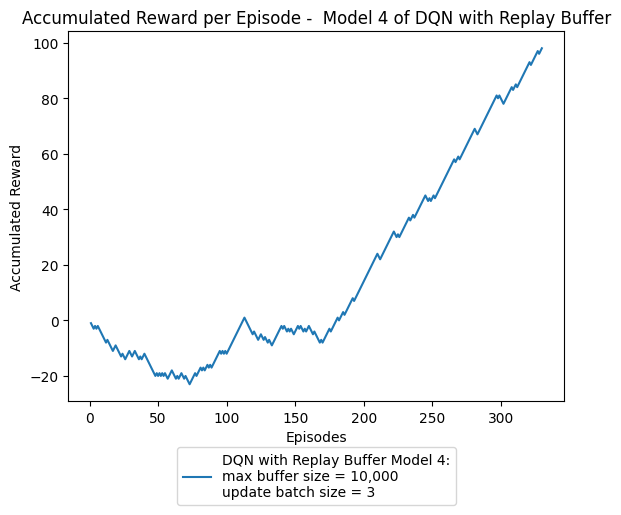

In [ ]:
rewards_per_episode_NN_buffer_model_4_accum = np.cumsum(rewards_per_episode_NN_buffer_model_4)
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_4_accum) + 1), rewards_per_episode_NN_buffer_model_4_accum)
plt.title('Accumulated Reward per Episode -  Model 4 of DQN with Replay Buffer')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
label = [f'DQN with Replay Buffer Model 4:\n'+
         f'max buffer size = 10,000\n' +
         f'update batch size = 3']

plt.legend(label, loc = 'lower center', bbox_to_anchor = (0.5,-0.3,0,0))
plt.show()

#### NNs with Replay Buffer Q learning Agents Models Convergence Curves Comparison

We can notice that when the maximum buffer size is considerably large all the NN Q learning Agents with replay buffer surpasses the tabular Q learning and also the NN Q learning agent without the replay buffer in the total accumulated reward at the end of the training episodes which shows the significance and importance of the replay buffer in the DQN agents training.

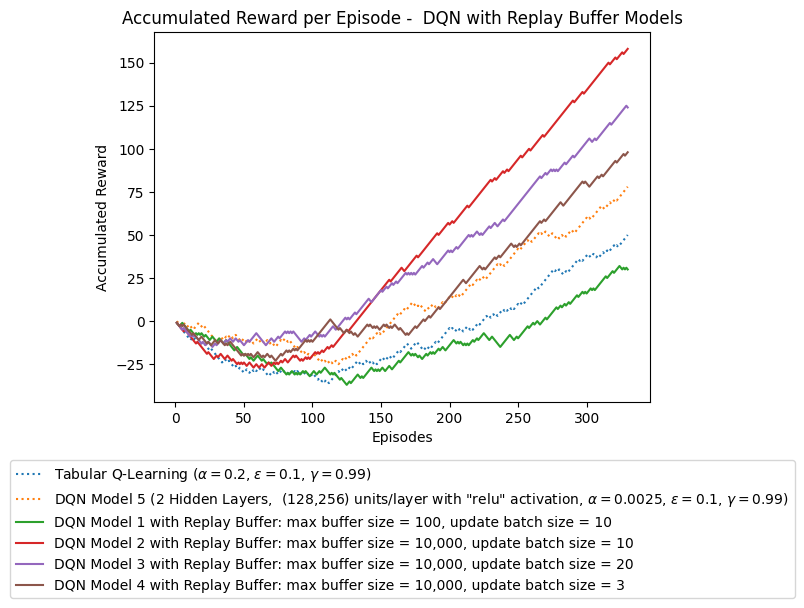

In [ ]:
# calculating the accumulated reward per epsiode for different tried models to compare their performance
rewards_per_episode_accum = np.cumsum(rewards_per_episode)
rewards_per_episode_NN_model5_accum = np.cumsum(rewards_per_episode_NN_model5)

rewards_per_episode_NN_buffer_model_1_accum = np.cumsum(rewards_per_episode_NN_buffer_model_1)
rewards_per_episode_NN_buffer_model_2_accum = np.cumsum(rewards_per_episode_NN_buffer_model_2)
rewards_per_episode_NN_buffer_model_3_accum = np.cumsum(rewards_per_episode_NN_buffer_model_3)
rewards_per_episode_NN_buffer_model_4_accum = np.cumsum(rewards_per_episode_NN_buffer_model_4)

plt.plot(np.arange(1, len(rewards_per_episode_accum[:330]) + 1), rewards_per_episode_accum[:330],':' ,label= r'Tabular Q-Learning ($\alpha = 0.2$, $\epsilon = 0.1$, $\gamma = 0.99$)')
plt.plot(np.arange(1, len(rewards_per_episode_NN_model5_accum[:330]) + 1),rewards_per_episode_NN_model5_accum[:330],':', label = r'DQN Model 5 (2 Hidden Layers,  (128,256) units/layer with "relu" activation, $\alpha = 0.0025$, $\epsilon = 0.1$, $\gamma = 0.99$)')
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_1_accum) + 1), rewards_per_episode_NN_buffer_model_1_accum, label ='DQN Model 1 with Replay Buffer: max buffer size = 100, update batch size = 10')
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_2_accum) + 1), rewards_per_episode_NN_buffer_model_2_accum, label ='DQN Model 2 with Replay Buffer: max buffer size = 10,000, update batch size = 10')
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_3_accum) + 1), rewards_per_episode_NN_buffer_model_3_accum, label ='DQN Model 3 with Replay Buffer: max buffer size = 10,000, update batch size = 20')
plt.plot(np.arange(1, len(rewards_per_episode_NN_buffer_model_4_accum) + 1), rewards_per_episode_NN_buffer_model_4_accum, label ='DQN Model 4 with Replay Buffer: max buffer size = 10,000, update batch size = 3')

plt.title('Accumulated Reward per Episode -  DQN with Replay Buffer Models')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')
plt.legend(loc = 'lower center', bbox_to_anchor = (0.5,-0.55,0,0))
plt.show()
